

# Importing Libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import time
import pickle
import warnings
import requests
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
from google.colab import drive
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, mean_absolute_error

# Data Extraction

In [ ]:
historical_data = []

In [ ]:
api_url = "https://api.freecurrencyapi.com/v1/historical"
api_key = "fca_live_wNpYFMP3EjKat4avoe5rLtKyjwMJddTwuZJoBbr4"

# Define the base currency
base_currency = 'AUD'


In [ ]:
def generate_all_dates(year):
    date = []
    start_date = datetime(year, 1, 1)
    end_date = datetime(year, 12, 31)

    current_date = start_date
    while current_date <= end_date:
        date.append(str(current_date.strftime("%Y-%m-%d")))
        current_date += timedelta(days=1)
    return date

date = generate_all_dates(2023)

In [ ]:
while(len(historical_data) != 365):
  params = {
          "apikey": api_key,
          "date": date[len(historical_data)],
          "base_currency": base_currency
      }

  # Make a GET request to the API for the current date
  response = requests.get(api_url, params=params)

  if response.status_code == 200:
      data = response.json()
      historical_data.append(data)
  else:
    print("no")
  print(len(historical_data))

In [ ]:
country_names = ['AUD','BGN','BRL','CAD','CHF','CNY','CZK','DKK','EUR','GBP','HKD','HRK','HUF','IDR','ILS','INR','ISK','JPY','KRW','MXN','MYR','NOK','NZD','PHP','PLN','RON','RUB','SEK','SGD','THB','TRY','USD','ZAR']

In [ ]:
value_dict = []

for i in range(len(historical_data)):
    value_dict.append(historical_data[i]['data'][date[i]])

In [ ]:
file_path = "/content/drive/MyDrive/DATASET/HKD.xlsx"
df = pd.read_excel(file_path)
for i in range(len(country_names)):
  temp = []
  for j in range(len(value_dict)):
    dit = value_dict[j]
    if country_names[i] in dit.keys():
      temp.append(dit[country_names[i]])
    else:
      temp.append('None')
  df[country_names[i]] = temp

if 'DATE' in df.columns:

    df['DATE'] = date

    df.to_excel(file_path, index=False)
else:
    print("The 'date' column does not exist in the DataFrame. Please make sure it exists in your Excel file.")

# Preprocessing

In [ ]:
file_paths = ["/content/drive/MyDrive/DATASET/AUD.xlsx", "/content/drive/MyDrive/DATASET/BGN.xlsx", "/content/drive/MyDrive/DATASET/BRL.xlsx", "/content/drive/MyDrive/DATASET/CAD.xlsx", "/content/drive/MyDrive/DATASET/CHF.xlsx", "/content/drive/MyDrive/DATASET/CNY.xlsx", "/content/drive/MyDrive/DATASET/CZK.xlsx", "/content/drive/MyDrive/DATASET/DKK.xlsx", "/content/drive/MyDrive/DATASET/EUR.xlsx", "/content/drive/MyDrive/DATASET/GBP.xlsx","/content/drive/MyDrive/DATASET/HKD.xlsx","/content/drive/MyDrive/DATASET/HRK.xlsx","/content/drive/MyDrive/DATASET/HUF.xlsx","/content/drive/MyDrive/DATASET/IDR.xlsx","/content/drive/MyDrive/DATASET/ILS.xlsx","/content/drive/MyDrive/DATASET/INR.xlsx","/content/drive/MyDrive/DATASET/ISK.xlsx","/content/drive/MyDrive/DATASET/JPY.xlsx","/content/drive/MyDrive/DATASET/KRW.xlsx","/content/drive/MyDrive/DATASET/MYR.xlsx","/content/drive/MyDrive/DATASET/MXN.xlsx","/content/drive/MyDrive/DATASET/NOK.xlsx","/content/drive/MyDrive/DATASET/NZD.xlsx","/content/drive/MyDrive/DATASET/PHP.xlsx","/content/drive/MyDrive/DATASET/PLN.xlsx","/content/drive/MyDrive/DATASET/RON.xlsx","/content/drive/MyDrive/DATASET/RUB.xlsx","/content/drive/MyDrive/DATASET/SEK.xlsx","/content/drive/MyDrive/DATASET/SGD.xlsx","/content/drive/MyDrive/DATASET/THB.xlsx","/content/drive/MyDrive/DATASET/TRY.xlsx","/content/drive/MyDrive/DATASET/USD.xlsx","/content/drive/MyDrive/DATASET/ZAR.xlsx"]

country_names = ['AUD','BGN','BRL','CAD','CHF','CNY','CZK','DKK','EUR','GBP','HKD','HRK','HUF','IDR','ILS','INR','ISK','JPY','KRW','MXN','MYR','NOK','NZD','PHP','PLN','RON','RUB','SEK','SGD','THB','TRY','USD','ZAR']

In [ ]:
df_list = []

for file_path in file_paths:
    df = pd.read_excel(file_path)
    df_list.append(df)

df_list

[           DATE  AUD       BGN       BRL       CAD       CHF       CNY  \
 0    2023-01-01    1  1.246032  3.605275  0.922950  0.630089  4.704036   
 1    2023-01-02    1  1.243395  3.650278  0.922900  0.628945  4.694701   
 2    2023-01-03    1  1.246214  3.685849  0.919794  0.629553  4.651095   
 3    2023-01-04    1  1.258428  3.709348  0.920661  0.634737  4.704500   
 4    2023-01-05    1  1.255829  3.615017  0.916124  0.632340  4.649408   
 ..          ...  ...       ...       ...       ...       ...       ...   
 360  2023-12-27    1  1.206506  3.308790  0.904940  0.577345  4.893290   
 361  2023-12-28    1  1.201517  3.312093  0.903058  0.575782  4.852190   
 362  2023-12-29    1  1.202903  3.304634  0.902656  0.573013  4.835914   
 363  2023-12-30    1  1.202904  3.304635  0.902656  0.573013  4.835914   
 364  2023-12-31    1  1.203029  3.305259  0.902156  0.573077  4.834003   
 
            CZK       DKK       EUR  ...        PHP       PLN       RON  \
 0    15.360277  4.7392

In [ ]:
for i, df in enumerate(df_list):

    print(f"EDA for DataFrame {i + 1}:")
    print(df.info())

    print(df.describe())

    # Check for missing values
    print(df.isnull().sum())

EDA for DataFrame 1:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 37 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   DATE         365 non-null    datetime64[ns]
 1   AUD          365 non-null    int64         
 2   BGN          365 non-null    float64       
 3   BRL          365 non-null    float64       
 4   CAD          365 non-null    float64       
 5   CHF          365 non-null    float64       
 6   CNY          365 non-null    float64       
 7   CZK          365 non-null    float64       
 8   DKK          365 non-null    float64       
 9   EUR          365 non-null    float64       
 10  GBP          365 non-null    float64       
 11  HKD          365 non-null    float64       
 12  HRK          365 non-null    float64       
 13  HUF          365 non-null    float64       
 14  IDR          365 non-null    float64       
 15  ILS          365 non-null    float64

# Prediction

In [ ]:
i = 0
models={}
for data in df_list:
  temp={}

  data['DATE'] = pd.to_datetime(data['DATE'])

  data['day_of_week'] = data['DATE'].dt.dayofweek
  data['month'] = data['DATE'].dt.month
  data['year'] = data['DATE'].dt.year

  features = ['day_of_week', 'month', 'year']

  for name in country_names:

    X = data[features]
    y = data[name]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)
    temp[name] = rf_model
    y_pred = rf_model.predict(X_test)
  models[country_names[i]]=temp
  i = i + 1
pickle_file_name = "/content/drive/MyDrive/DATASET/models.pkl"

# Save the dictionary of models to the pickle file
with open(pickle_file_name, 'wb') as pickle_file:
    pickle.dump(models, pickle_file)


In [ ]:
pickle_file_name = "/content/drive/MyDrive/DATASET/models.pkl"
with open(pickle_file_name, 'rb') as pickle_file:
    models = pickle.load(pickle_file)

print(models)

In [ ]:
# Function for making predictions
def make_currency_prediction(date, from_country , to_country):
  user_date = pd.to_datetime(date)
  user_features = [user_date.dayofweek, user_date.month, user_date.year]

  rf_model = models[from_country][to_country]

  predicted_rate = rf_model.predict([user_features])[0]

  print(f"Predicted {to_country} exchange rate for {user_date}: {predicted_rate}")

user_date = '2024-01-13'
from_country = 'AUD'
to_country = 'HRK'

result = make_currency_prediction(user_date, from_country ,to_country)



In [ ]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")


Mean Squared Error: 0.0
R-squared: 1.0


# Visualization


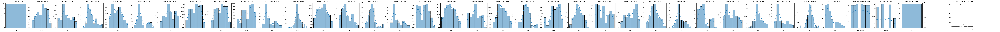

In [ ]:
for i, df in enumerate(df_list):


    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    num_numeric_cols = len(numeric_cols)
    num_plots = num_numeric_cols + 3  # Three extra subplots for pair plot, box plot, and spacing

    # Create a new figure with subplots
    fig, axes = plt.subplots(1, num_plots, figsize=(4 * num_plots, 4))

    # Create subplots for the numeric columns
    for j, col in enumerate(numeric_cols):
        sns.histplot(df[col], kde=True, ax=axes[j])
        axes[j].set_title(f'Distribution of {col}')

    # Create a pair plot in a separate figure
    if num_numeric_cols > 1:
        sns.pairplot(df)

    # Create a box plot to visualize the spread and identify outliers
    sns.boxplot(data=df, orient="v", ax=axes[num_numeric_cols + 1])
    axes[num_numeric_cols + 1].set_title("Box Plot of Numeric Columns")

    # Create an empty subplot for spacing
    axes[num_numeric_cols + 2].axis('off')

    # Separate EDA sections with a line for clarity
    print("\n" + "=" * 50 + "\n")

    plt.tight_layout()
    plt.show()
    break

In [ ]:
data = pd.read_excel("/content/drive/MyDrive/DATASET/AUD.xlsx")
data['DATE'] = pd.to_datetime(data['DATE'])


for j in range(len(country_names)):
    if(country_names[j] == 'AUD'):
      continue
    else:
      fig = px.line(data, x='DATE', y=country_names[j], title=f'Foreign Exchange Rates Over Time ({country_names[j]})')
      fig.update_xaxes(title_text="Date")
      fig.update_yaxes(title_text="Exchange Rate")

      fig.show()
      break


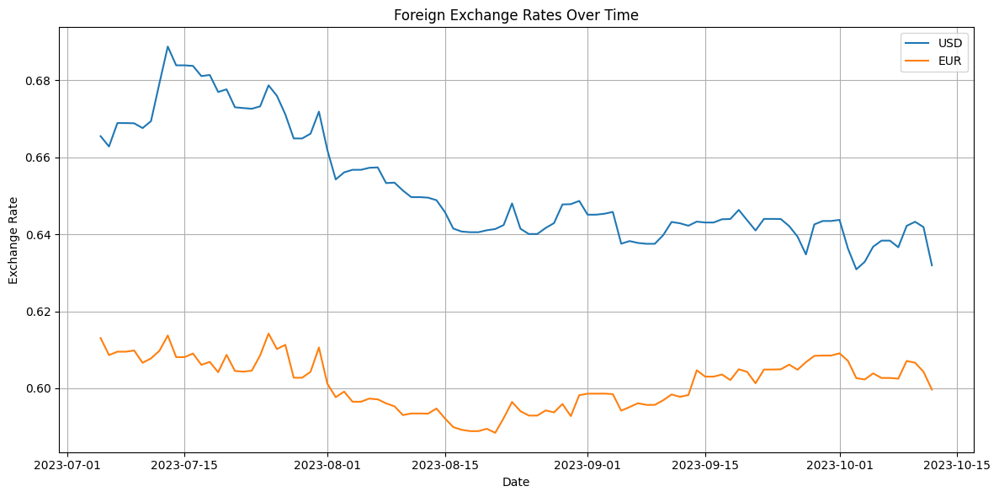

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


data = pd.read_excel("/content/drive/MyDrive/DATASET/AUD.xlsx")
data['DATE'] = pd.to_datetime(data['DATE'])  # Convert the DATE column to a datetime object

currencies = ['USD', 'EUR']

plt.figure(figsize=(12, 6))

for currency in currencies:
    plt.plot(data['DATE'], data[currency], label=currency)


plt.title("Foreign Exchange Rates Over Time")
plt.xlabel("Date")
plt.ylabel("Exchange Rate")
plt.legend()
plt.grid(True)
sns.set_style("whitegrid")

plt.tight_layout()
plt.show()


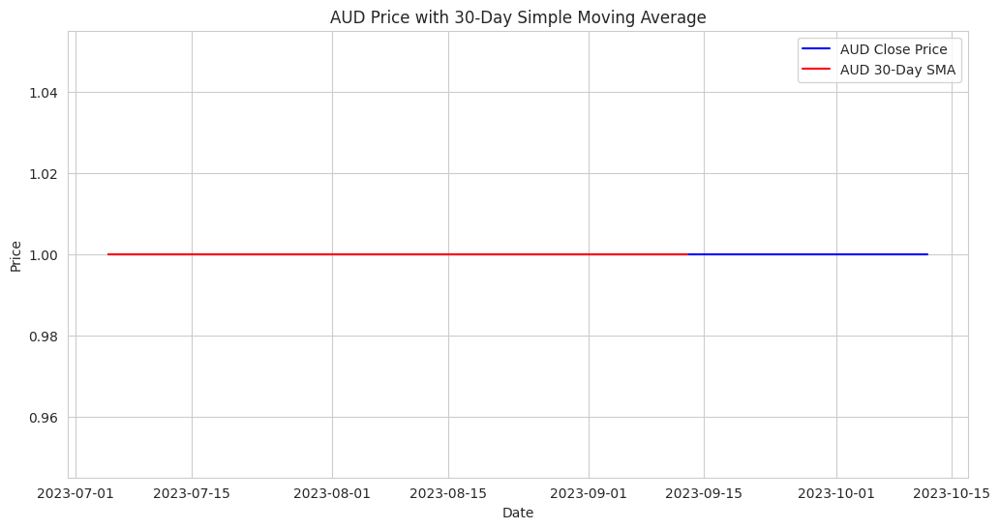

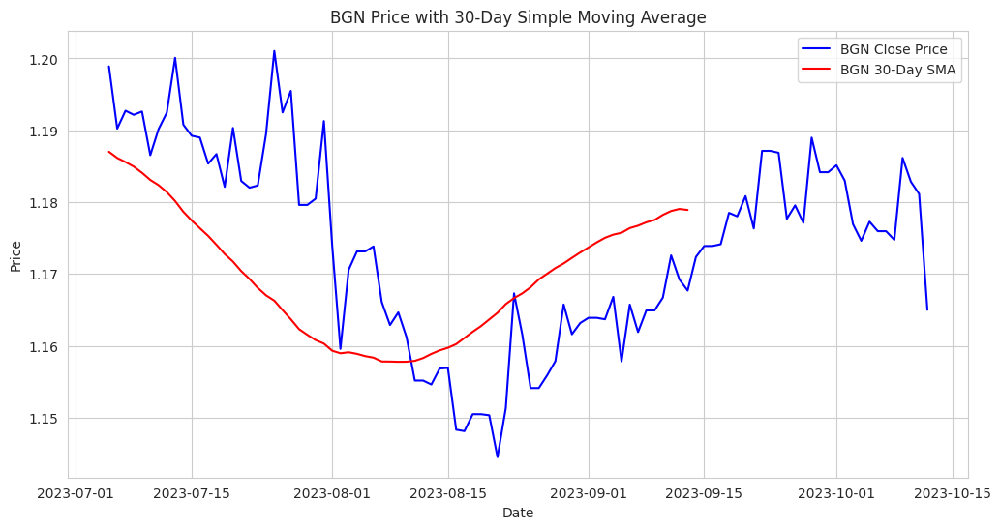

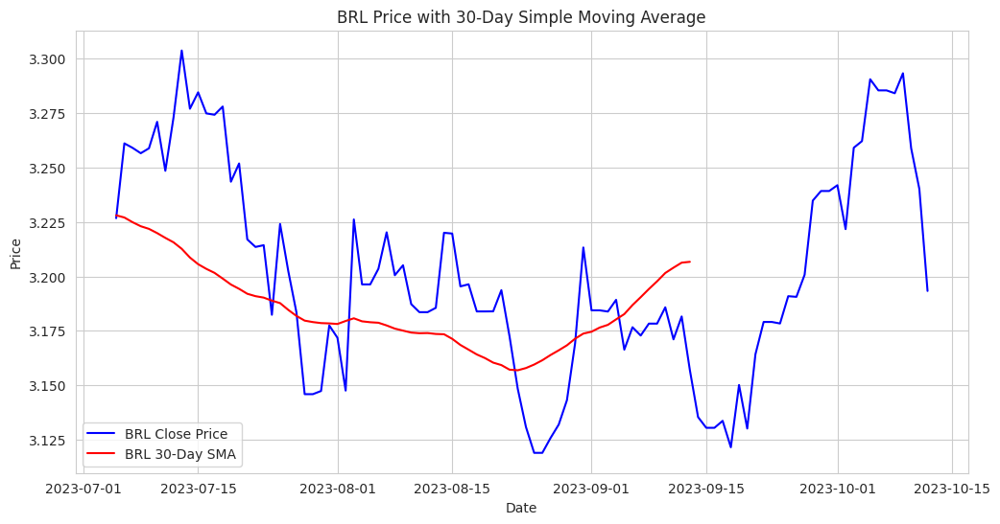

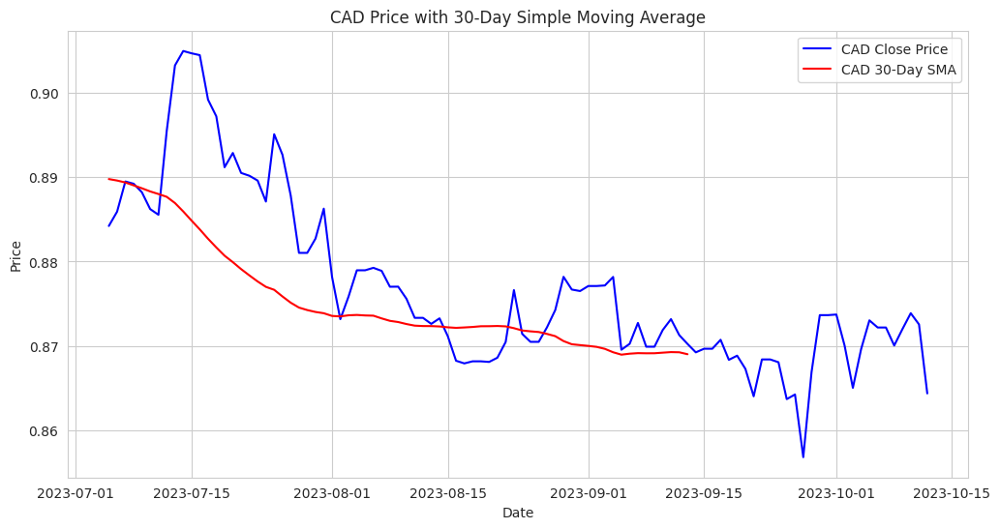

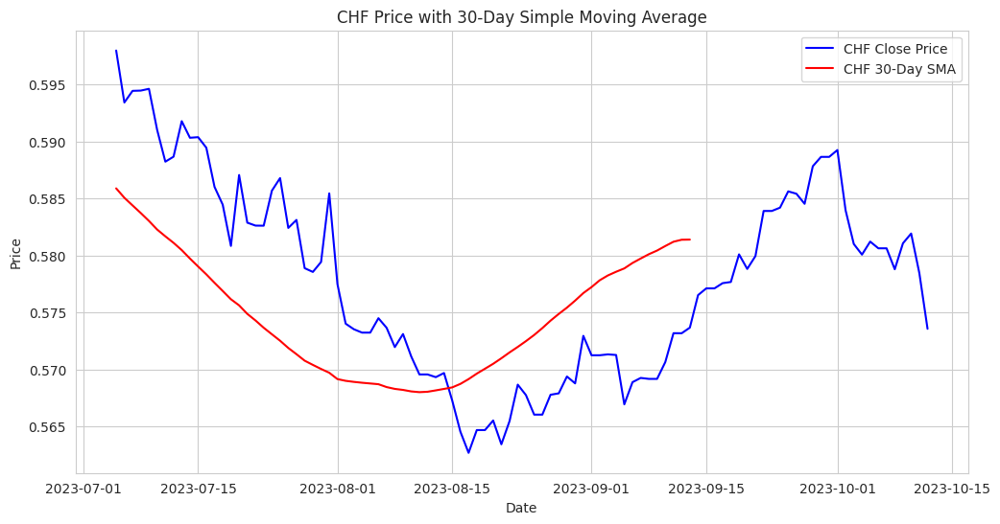

...

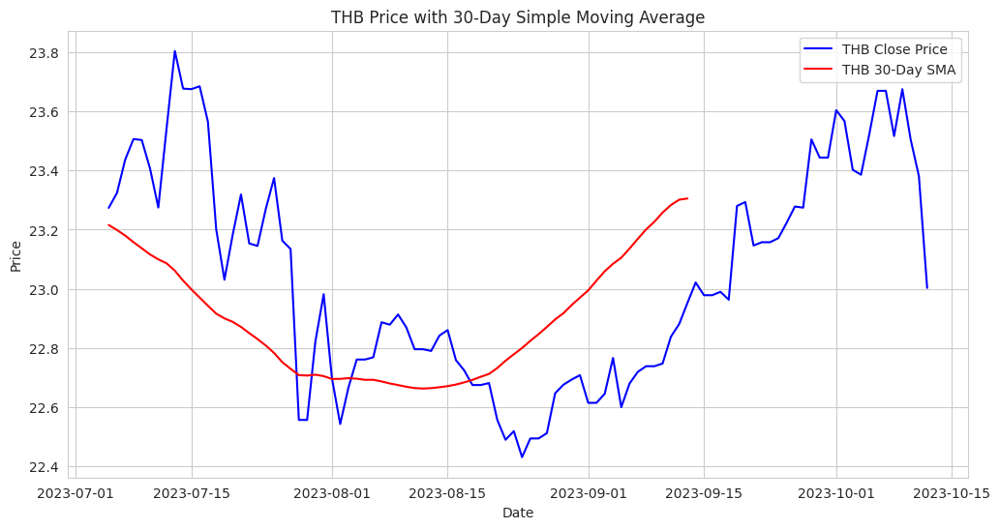

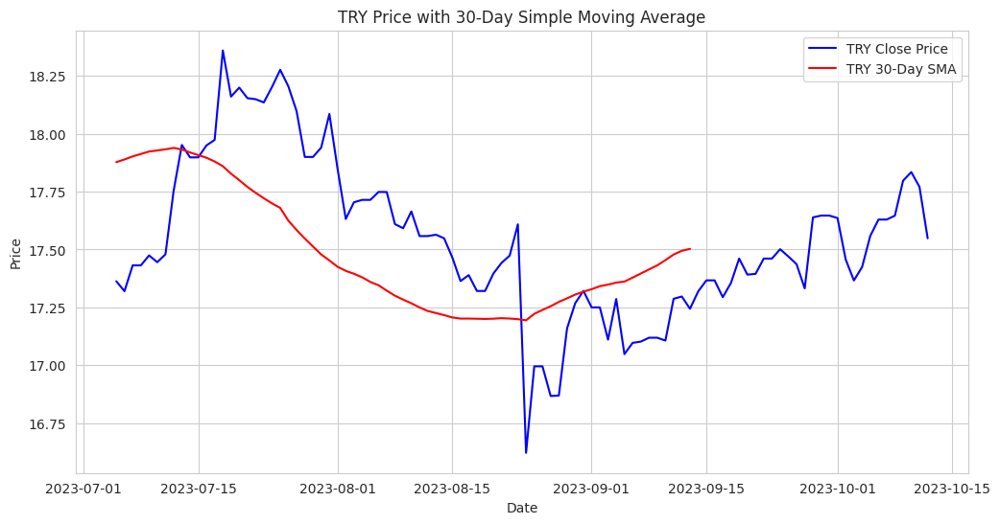

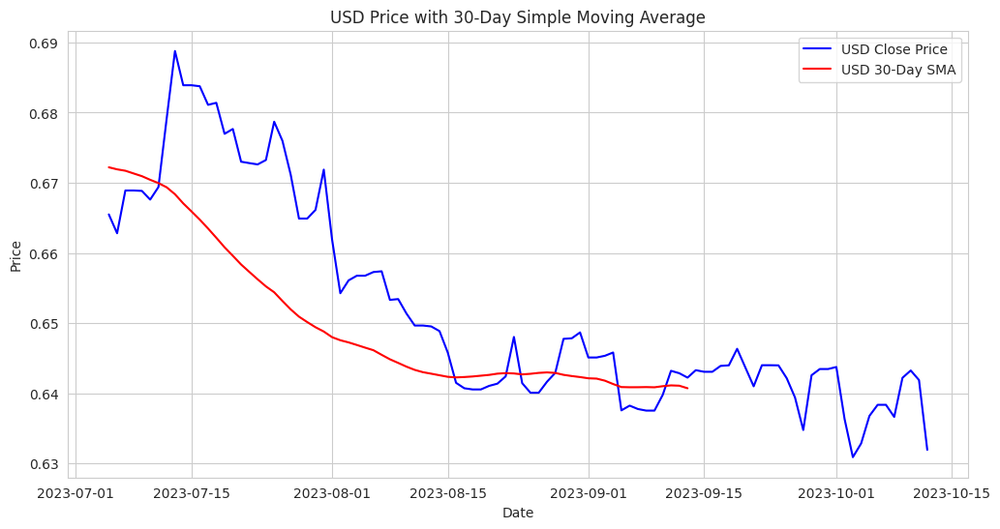

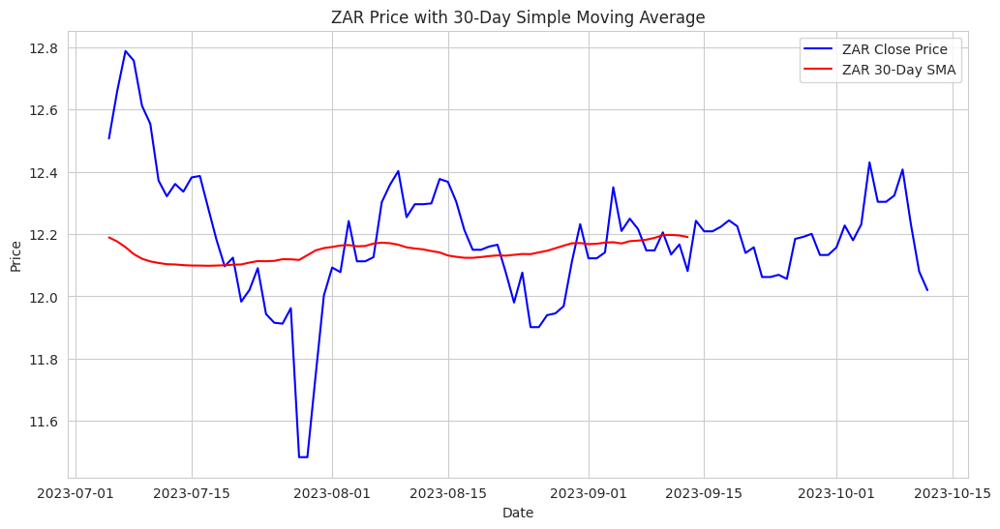

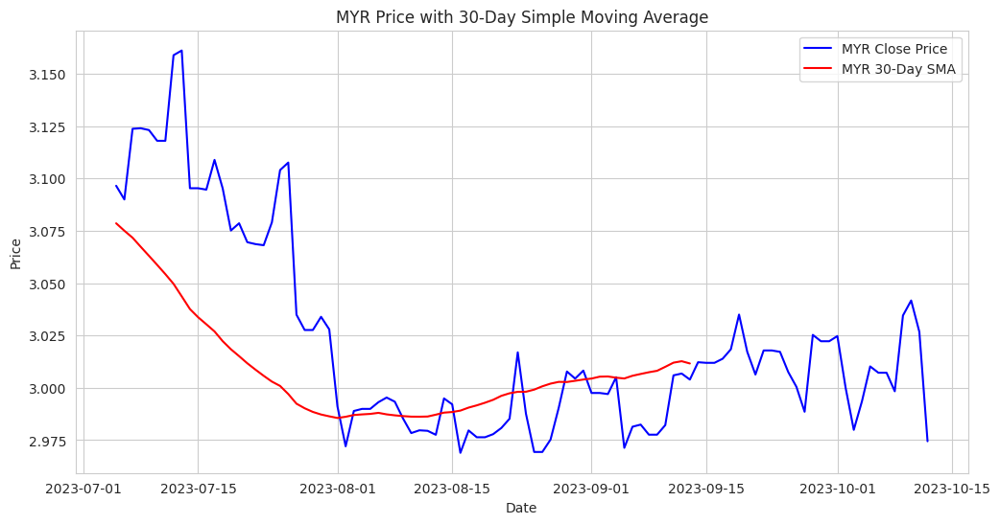

In [ ]:
data = pd.read_excel('/content/drive/MyDrive/DATASET/AUD.xlsx', parse_dates=True, index_col='DATE')

# Calculate a 30-day Simple Moving Average (SMA) for each currency pair
for column in data.columns:
    if column != 'DATE':
        data[f'{column} 30-Day SMA'] = data[column].rolling(window=30).mean()

# Create individual graphs for each currency pair
for column in data.columns:
    if ' 30-Day SMA' in column:
        currency_pair = column.split(' ')[0]
        plt.figure(figsize=(12, 6))
        plt.plot(data.index, data[currency_pair], label=f'{currency_pair} Close Price', color='blue')
        plt.plot(data.index, data[column], label=f'{currency_pair} 30-Day SMA', color='red')
        plt.title(f'{currency_pair} Price with 30-Day Simple Moving Average')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()


<ipython-input-27-0c4640d36ec6>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



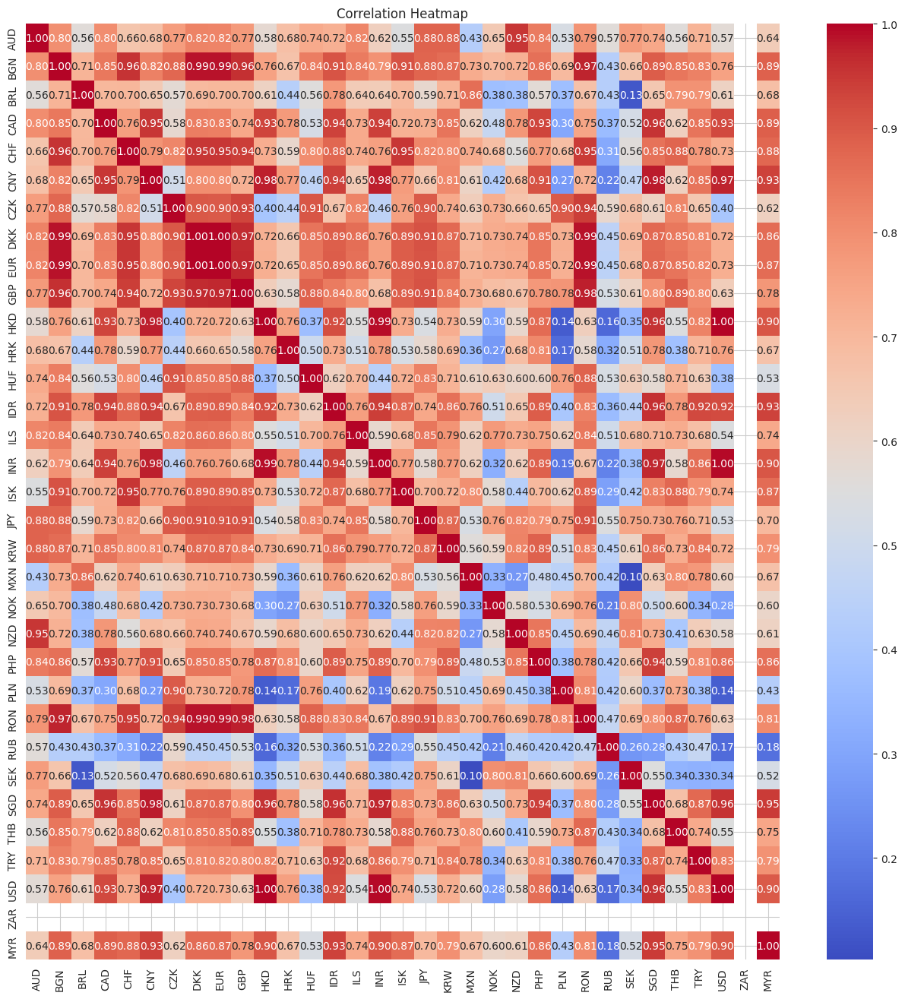

In [ ]:
correlation_matrix = df.corr()
plt.figure(figsize=(16, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

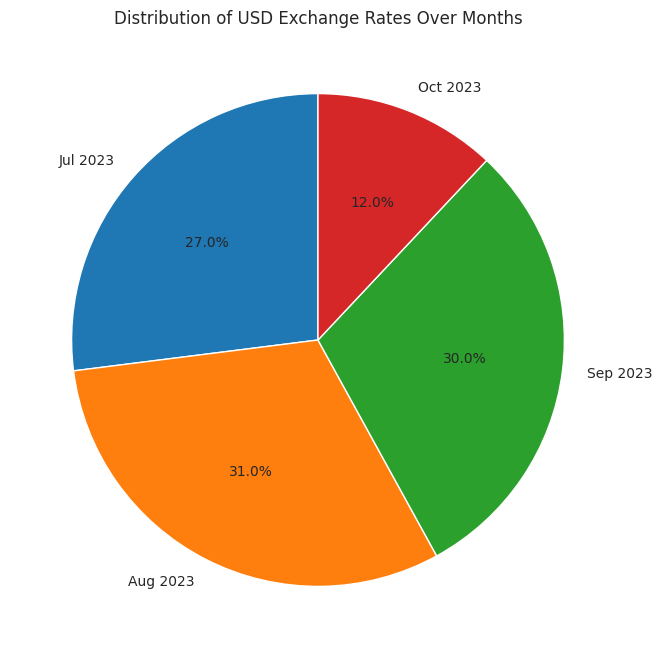

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the currency of interest
currency_of_interest = 'USD'  # Replace with the currency you want to analyze

# Read the data for the currency of interest
currency_data = pd.read_excel("/content/drive/MyDrive/DATASET/" + currency_of_interest + ".xlsx")
currency_data['DATE'] = pd.to_datetime(currency_data['DATE'])

# Group the data by months and calculate the sum of exchange rates for each month
currency_data['Month'] = currency_data['DATE'].dt.to_period('M')
exchange_rate_sum = currency_data.groupby('Month')[currency_of_interest].sum()

# Create a pie chart to visualize the distribution of exchange rates over months
plt.figure(figsize=(8, 8))
plt.pie(exchange_rate_sum, labels=exchange_rate_sum.index.strftime('%b %Y'), autopct='%1.1f%%', startangle=90)
plt.title(f'Distribution of {currency_of_interest} Exchange Rates Over Months')
plt.show()